# **AP157 Image Processing Lab Assignment**
### Module B2: Fourier Transform Applications in Image Processing

_Instructions_: Answer each part of the assignment as completely as you can. Discuss **all** your code and results as clearly and concisely as possible.

_Scoring Criteria_: 50% - *correctness of code*; 50% - *discussion of the code and results*. Maximum score is **100 points** (Parts 1 and 2 are worth 20 and 80 points, respectively).

_Credits_: This lab assignment is based on the AP157 modules of Dr. Maricor Soriano and scripts created by Mr. Rene Principe

### Student Information

_Full Name (Last Name, First Name)_: Escaran, Jed Jerrel K.\
_Student No._: 2021-07451\
_Section_: tx-1

### Submission Information

_Date and Time Submitted (most recent upload)_ 18/04/24 1159pm:

**HONOR PLEDGE** I affirm that I have upheld the highest principles of honesty and integrity in my academic work and that this lab assignment is my own work.

**Sign here with your full name: Jed Jerrel Escaran**

### Grading Information (c/o Instructor)

TOTAL SCORE: **[]**/100

Score breakdown:
* Part 1 - []/30
* Part 2 - []/20
* Part 3 - []/20
* Part 4 - []/30

_Date and Time Scored (MM/DD/YYYY HH:MM AM/PM):_

In [58]:
# import libraries
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import Polygon
from mpl_toolkits.axes_grid1 import make_axes_locatable
from tqdm import tqdm

from numpy.fft import fft2,ifft2,fftshift,ifftshift
import random

import cv2

from skimage import color, data, exposure
from skimage.transform import rescale

#### PART 1 - Apply 2D FFT on simple apertures *(30 points)*

1. [15 pts.] Rectangular apertures with (width, height):
- (50, 20) pixels
- (20, 50) pixels
2. [15 pts.] Circular apertures with radii:
- 5 pixels
- 10 pixels
- 20 pixels

For each aperture type, perform the following steps:

- **Step 1: Define Input Aperture**
  - Generate a 2D array representing a rectangle/circle with the specified size within a square grid of size 128 pixels (representing an optical system, for example).
  
- **Step 2: Compute Fourier Transform**
  - Use the Fast Fourier Transform (FFT) algorithm to compute the Fourier transform of the input aperture.

- **Step 3: Shift the FFT**
  - Shift the zero frequency component of the Fourier transform to the center.

- **Step 4: Visualization (Plotting)**
  - Plot the original aperture.
  - Plot the magnitude of the shifted Fourier transform.
  - Plot the log-scaled magnitude of the shifted Fourier transform.
  - Add colorbars to the plots for reference.

- **Step 5: Display**
  - Display the plots in a single figure with three subplots (original aperture, FFT magnitude, log-scaled FFT magnitude).



In [59]:
def fft(a):
  return np.fft.fftshift(np.fft.fft2(a))

#func to compute ft and shift to center

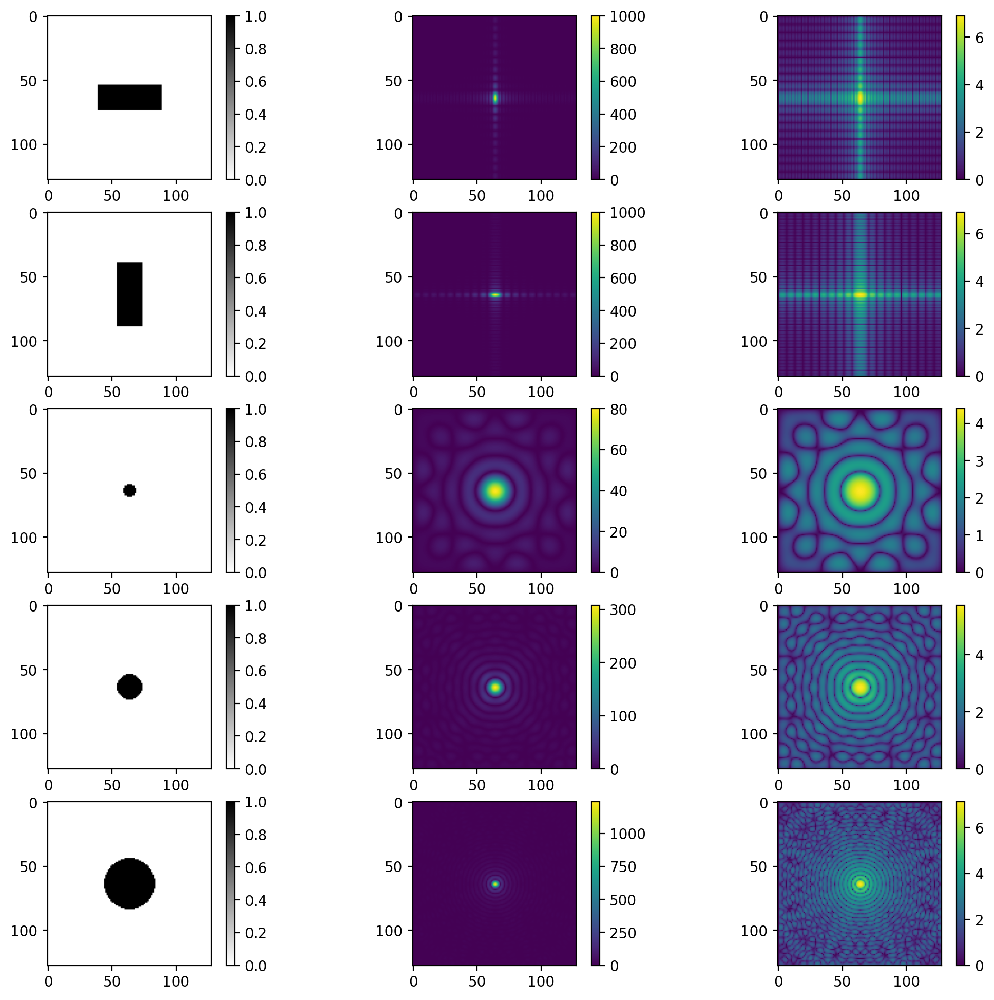

In [60]:
N = 128  # defines the image resolution

# grid
xx = np.linspace(-1, 1, N)
X, Y = np.meshgrid(xx, xx)

# rectangle dimensions
rect5020_width = 2.0 * 50 / N
rect5020_height = 2.0 * 20 / N

rect2050_width = 2.0 * 20 / N
rect2050_height = 2.0 * 50 / N

# rectangular apertures
rect5020 = np.zeros((N, N))
rect5020[np.where((np.abs(X) < rect5020_width / 2) & (np.abs(Y) < rect5020_height / 2))] = 1.0
rect5020_fft = fft(rect5020)

rect2050 = np.zeros((N, N))
rect2050[np.where((np.abs(X) < rect2050_width / 2) & (np.abs(Y) < rect2050_height / 2))] = 1.0
rect2050_fft = fft(rect2050)


# circular apertures radii
rad5 = 2*5/N
rad10 = 2*10/N
rad20 = 2*20/N
R = np.sqrt(X**2 + Y**2)

# circular apertures
cir5 = np.zeros(np.shape(R))
cir5[np.where(R < rad5)] = 1.0
cir5_fft = fft(cir5)

cir10 = np.zeros(np.shape(R))
cir10[np.where(R < rad10)] = 1.0
cir10_fft = fft(cir10)

cir20 = np.zeros(np.shape(R))
cir20[np.where(R < rad20)] = 1.0
cir20_fft = fft(cir20)

# Plot
fig = plt.figure(figsize=(13,12), dpi=200)

plt.subplot(5,3,1)
plt.imshow(rect5020, cmap='binary')
plt.colorbar()
plt.subplot(532)
plt.imshow(np.abs(rect5020_fft))
plt.colorbar()
plt.subplot(533)
plt.imshow(np.log(1 + np.abs(rect5020_fft)))
plt.colorbar()

plt.subplot(5,3,4)
plt.imshow(rect2050, cmap='binary')
plt.colorbar()
plt.subplot(535)
plt.imshow(np.abs(rect2050_fft))
plt.colorbar()
plt.subplot(536)
plt.imshow(np.log(1 + np.abs(rect2050_fft)))
plt.colorbar()

plt.subplot(5,3,7)
plt.imshow(cir5, cmap='binary')
plt.colorbar()
plt.subplot(538)
plt.imshow(np.abs(cir5_fft))
plt.colorbar()
plt.subplot(539)
plt.imshow(np.log(1 + np.abs(cir5_fft)))
plt.colorbar()

plt.subplot(5,3,10)
plt.imshow(cir10, cmap='binary')
plt.colorbar()
plt.subplot(5,3,11)
plt.imshow(np.abs(cir10_fft))
plt.colorbar()
plt.subplot(5,3,12)
plt.imshow(np.log(1 + np.abs(cir10_fft)))
plt.colorbar()

plt.subplot(5,3,13)
plt.imshow(cir20, cmap='binary')
plt.colorbar()
plt.subplot(5,3,14)
plt.imshow(np.abs(cir20_fft))
plt.colorbar()
plt.subplot(5,3,15)
plt.imshow(np.log(1 + np.abs(cir20_fft)))
plt.colorbar()

#### PART 2 - Convolution *(20 points)*

Now that we've shown that FT acts as if an imaging system, suppose we have an image and convolve it with a circular aperture with different radii. Assuming that the circular aperture is a camera lens, we want to show how the reconstruction of the original image can be limited by the properties of the camera lens (or any imaging device) such as aperture size.

Take the astronaut image from skimage and convolve it with circular apertures of radii: 8, 32, and 64 pixels.

To do this, you can perform the ff. steps:

- **Compute Fourier Transform of Image:**
  - Use `fft2` to compute the 2D Fourier Transform of the input image.
  
- **Compute Fourier Transform of Aperture:**
  - Use `fftshift` to shift the zero-frequency component to the center.

- **Perform Element-wise Multiplication in Frequency Domain:**
  - Multiply the Fourier Transform of the image and the shifted aperture element-wise in the frequency domain.

- **Compute Inverse Fourier Transform:**
  - Use `ifft2` to compute the 2D Inverse Fourier Transform of the product from the previous step.

- **Visualization (Plotting):**
  - Create a figure with three subplots to visualize the original image, the aperture, and the convolution result.

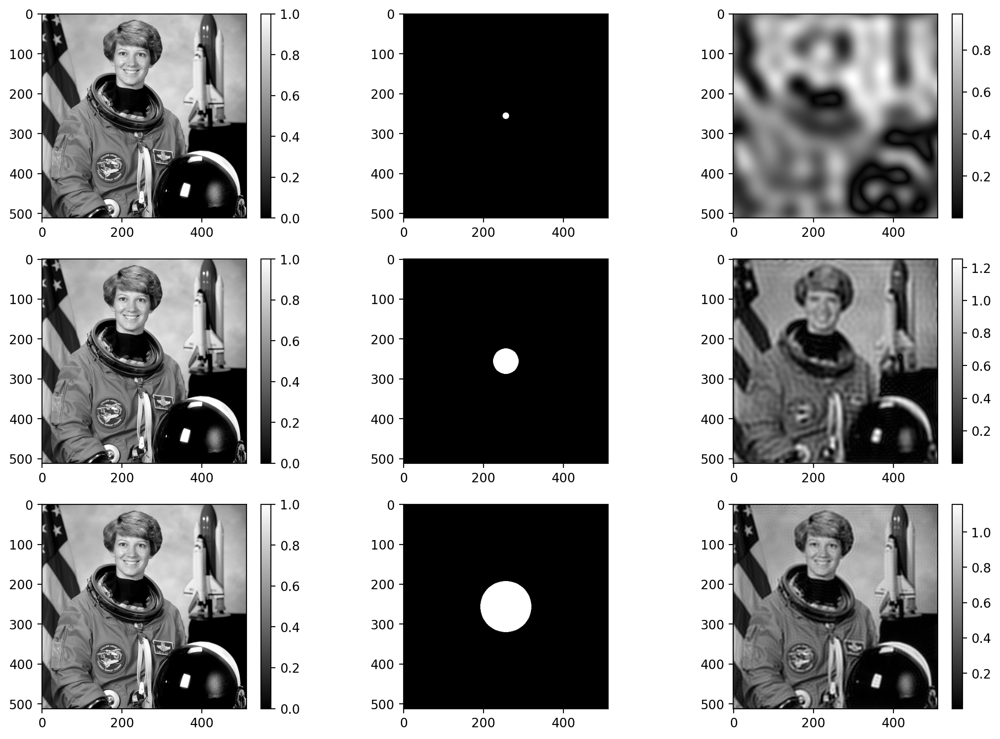

In [61]:
# import img and fft
img = color.rgb2gray(data.astronaut())
img_fft = fft2(img)


N_ = 512  # defines the image resolution

# grid
xx_ = np.linspace(-1, 1, N_)
X_, Y_ = np.meshgrid(xx_, xx_)

# radii
rad8 = 2*8/N_
rad32 = 2*32/N_
rad64 = 2*64/N_
R_ = np.sqrt(X_**2 + Y_**2)

# circular apertures
cir8 = np.zeros(np.shape(R_))
cir8[np.where(R_ < rad8)] = 1.0
cir8_fft = fftshift(cir8)

cir32 = np.zeros(np.shape(R_))
cir32[np.where(R_ < rad32)] = 1.0
cir32_fft = fftshift(cir32)

cir64 = np.zeros(np.shape(R_))
cir64[np.where(R_ < rad64)] = 1.0
cir64_fft = fftshift(cir64)

# multiply the ft of the image and the shifted aperture
conv8 = img_fft * cir8_fft
conv32 = img_fft * cir32_fft
conv64 = img_fft * cir64_fft

# inverse ft
conv8inv = ifft2(conv8)
conv32inv = ifft2(conv32)
conv64inv = ifft2(conv64)

# plotting
fig = plt.figure(figsize=(14,10), dpi=200)

plt.subplot(331)
plt.imshow(img, cmap='gray')
plt.colorbar()

plt.subplot(332)
plt.imshow(fftshift(cir8_fft), cmap='gray')

plt.subplot(333)
plt.imshow(np.abs(conv8inv), cmap='gray')
plt.colorbar()

plt.subplot(334)
plt.imshow(img, cmap='gray')
plt.colorbar()

plt.subplot(335)
plt.imshow(fftshift(cir32_fft), cmap='gray')

plt.subplot(336)
plt.imshow(np.abs(conv32inv), cmap='gray')
plt.colorbar()

plt.subplot(337)
plt.imshow(img, cmap='gray')
plt.colorbar()

plt.subplot(338)
plt.imshow(fftshift(cir64_fft), cmap='gray')

plt.subplot(339)
plt.imshow(np.abs(conv64inv), cmap='gray')
plt.colorbar()


 by inspecting the filtered images, we can observe how the circular apertures with different radii affect the image. smaller circular apertures filter out lower frequency components, while larger circular apertures filter out higher frequency components. this demonstrates how filtering in the frequency domain can selectively modify different spatial frequency components of the image.

#### PART 3 - Correlation *(20 points)*

In this task, we observe using the correlation method that the similarity between two functions can be extracted-- this is also referred to as template matching.

You can get the test and target images from the "Datasets" folder in the course GDrive:
- AP157_moduleB2_correlation_test_image.png (with text "The Rain in Spain Stays Mainly in the Plain")
- AP157_moduleB2_correlation_target_image.png (with text "A")

In the correlation result, the high intensity portions indicate the presence of letter 'A' on the test image.

To get the correlation, you can perform the ff. steps:

- **Compute Fourier Transforms:**
  - Use `fft2` to compute the 2D Fourier Transform of the input test image (`image`).
  - Use `fft2` and `np.conj` to compute the complex conjugate of the 2D Fourier Transform of the target template.

- **Compute Cross-Correlation in Frequency Domain:**
  - Multiply the Fourier Transforms of the image and the complex conjugate of the Fourier Transform of the target template element-wise in the frequency domain.

- **Compute Inverse Fourier Transform:**
  - Use `ifft2` to compute the 2D Inverse Fourier Transform of the correlation.

- **Visualization (Plotting):**
  - Create a figure with three subplots to visualize the original image, the target image, and the correlation result.
  - Add colorbars to each subplot for reference and to visualize intensity levels.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


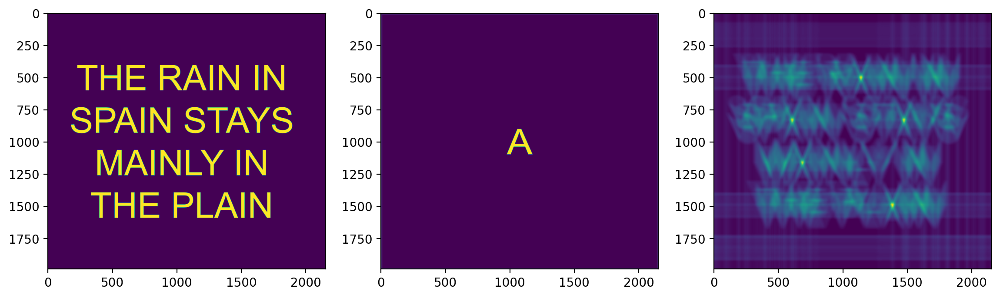

In [62]:
#importing
from google.colab import drive
drive.mount("/content/drive")
file_path = "/content/drive/My Drive/157/"

# Read the test image, convert it to grayscale
test = cv2.imread(file_path + 'test.png')
test = cv2.cvtColor(test, cv2.COLOR_BGR2GRAY)

# Read the target image, resize to fit test, convert it to grayscale
target = cv2.imread(file_path + 'target.png')
target = cv2.resize(target, (test.shape[1], test.shape[0]))
target = cv2.cvtColor(target, cv2.COLOR_BGR2GRAY)

test_fft = fft2(test)                                     # 2d ft of the test image
target_fftconj = np.conj(fft2(target))                    # complex conjugate of 2d ft of target template

corr = test_fft * target_fftconj                          # computing cross-correlation in the frequency domain by element-wise multiplication
corr_ifft = ifft2(corr)                                   # computing inverse ft of the correlation to obtain the correlation result in the spatial domain

#plotting
fig = plt.figure(figsize=(14,10), dpi=200)
plt.subplot(131)
plt.imshow(test)

plt.subplot(132)
plt.imshow(target)

plt.subplot(133)
plt.imshow(np.abs(fftshift(corr_ifft)))

#### PART 4 - Application: Canvas Weave Modeling and Removal *(30 points)*

Suppose we want to investigate the brush strokes of a painter. However, the texture of the canvas obscures our view of the brushstrokes. Let’s use FFT to remove the canvas weave.

Perform the ff. steps:

1. Open the image AP157_moduleB_canvas_weave_image.jpg (also in the Datasets folder; the image is from a painting by Dr. Vincent Daria.) and convert into a grayscale image. To enhance the detection of repeating patterns we first subtract the mean grayscale from the image. This will remove the DC bias of intensity images.

2. Take the FT of the mean-subtracted image and take note of the symmetric peaks. These are the sinusoids that make up the canvas weave image, similar to the rotation property of sinusoids we did earlier.

3. Manually create a filter mask in the FT space to remove the canvas weave patterns. This is a matrix which is the same size as the image. The filter is all 1’s but are zero at the locations of the sinusoidal peaks. FFT shift this filter and multiply this to the complex FT of the Red, Green and Blue channels of the original image (not mean subtracted). The filter essentially “erases” the peaks. Take the inverse FT of the filtered FT and overlay the filtered R,G,B images. Did the canvas weave vanish enough that the paint and brushstrokes remain?

4. Invert the filter mask (0's become 1's and vice versa) and take the inverse Fourier transform. Observe the generated modulus image. Is it close to the appearance of the canvas weave?

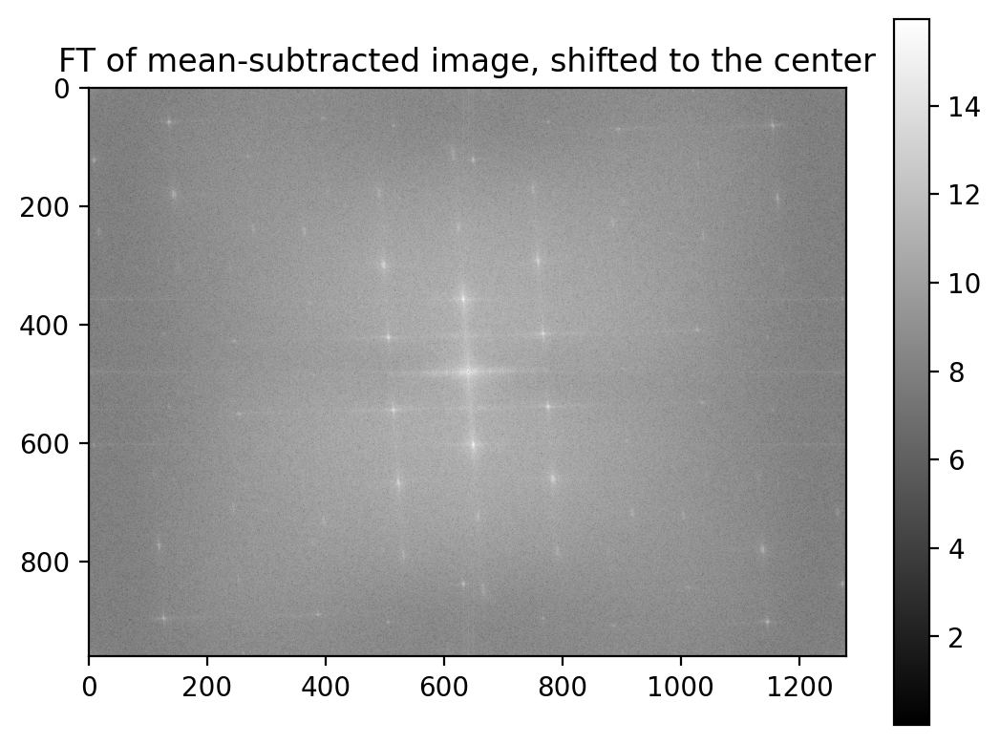

In [116]:
img = cv2.imread(file_path + 'painting.jpg')         # reading image
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)       # converting BGR to RGB
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY) # RGB to GRAY
img_gray_enh = img_gray - np.mean(img_gray)          # enhancing by subtracting mean grayscale from the image

imgfft = fft2(img_gray_enh)                          # ft of mean-subtracted image
imgffts = fftshift(imgfft)                           # shifted to center
plt.figure(dpi=200)
plt.title('FT of mean-subtracted image, shifted to the center')
plt.imshow(np.log(1+np.abs(imgffts)), cmap="gray")
plt.colorbar()

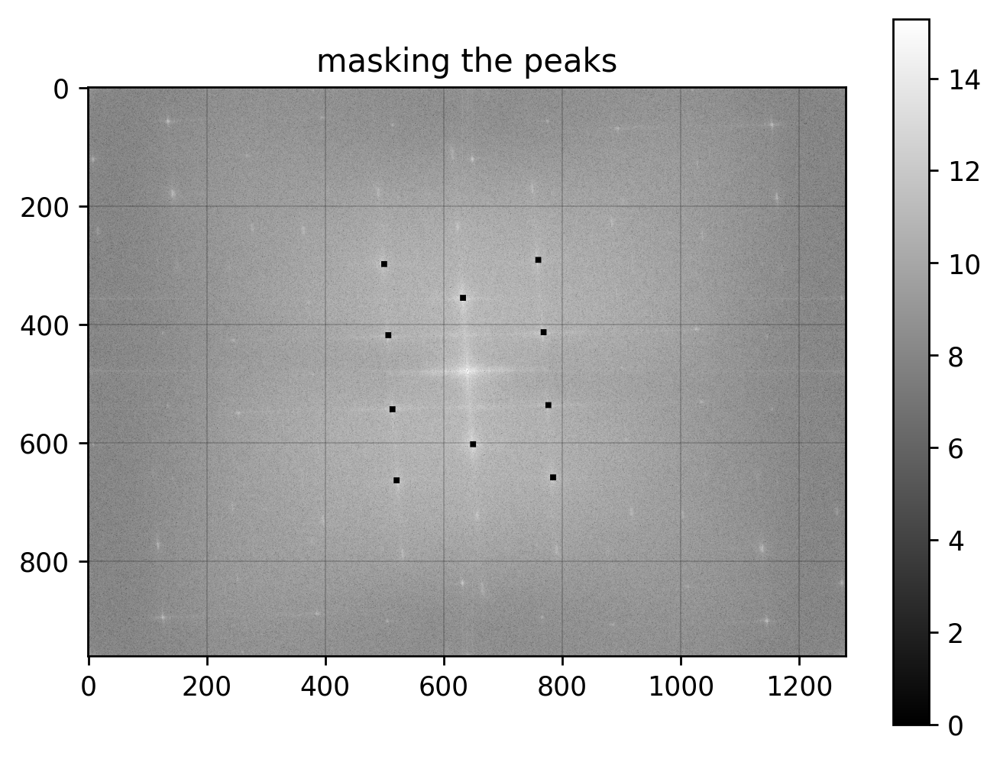

In [119]:
mask = np.ones(imgffts.shape)            # manually making a filter mask
r = 5
                                         # manually obtained coordinates, set to 0 to "block" peaks
mask[300-r:300+r , 500-r:500+r] = 0
mask[293-r:293+r , 760-r:760+r] = 0
mask[357-r:357+r , 633-r:633+r] = 0
mask[420-r:420+r , 507-r:507+r] = 0
mask[415-r:415+r , 769-r:769+r] = 0
mask[545-r:545+r , 514-r:514+r] = 0
mask[665-r:665+r , 521-r:521+r] = 0
mask[538-r:538+r , 777-r:777+r] = 0
mask[660-r:660+r , 785-r:785+r] = 0
mask[604-r:604+r , 650-r:650+r] = 0

masked = mask * imgffts                  # multiplying to see if mask was able to "block" peaks accurately
plt.figure(dpi=250)
plt.imshow(np.log(1+np.abs(masked)), cmap="gray")
plt.colorbar()
plt.title("masking the peaks")
plt.grid(linewidth="0.1", color='black')


below is an attempt to automate generation of filter mask by identifying peaks and covering them with a black square. range was arbitrarily selected, set to 200. to avoid covering the center fringe, boundary conditions were set (skip indeces in >= 450 and <= 525 range).

In [ ]:
maskk = np.ones(imgffts.shape)
r=5
auto = maskk * imgffts

for i in range(200):
    # flatten the array to find the indices of top 10 values
    flattened_indices = np.argsort(auto, axis=None)[-200:]

    # convert flattened indices to 2D indices
    indices = np.unravel_index(flattened_indices, imgffts.shape)
    if indices[0][i] >= 450 and indices[0][i] <= 525:                                  # to skip peak at center
        continue
    maskk[indices[0][i]-r:indices[0][i]+r,indices[1][i]-r:indices[1][i]+r]=0           # black box
    b = auto * imgffts
    print(i)


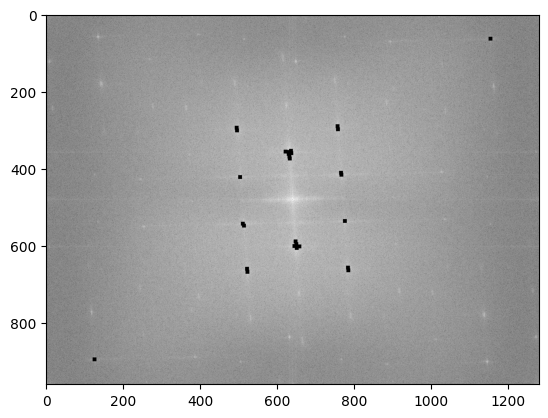

In [110]:
plt.imshow(np.log(1+np.abs(maskk*imgffts)), cmap="gray")

automatically generated filter mask is somehow similar to manually generated filter mask, which means manual judgement of which peak is bright and must be covered was accurate.

In [111]:
b,g,r = cv2.split(img_rgb)                                      # splitting to seperate bands, bgr is standard for cv2
mask_decentered = fftshift(mask)                                # shifting mask again to decenter

redfft = fft2(r)                                                # fft of r, g, and b
bluefft = fft2(b)
greenfft = fft2(g)

redfilt = mask_decentered * redfft                              # application of filter: decentered mask * decentered ffts of r g and b
bluefilt = mask_decentered * bluefft
greenfilt = mask_decentered * greenfft

red_new = np.abs(ifft2(redfilt)).astype(np.uint8)               # inversed r,g,b, ready for merging
green_new = np.abs(ifft2(greenfilt)).astype(np.uint8)
blue_new = np.abs(ifft2(bluefilt)).astype(np.uint8)

img_filt = cv2.merge([blue_new,green_new,red_new])              # filtered rgb merged

Text(0.5, 1.0, 'without weavings')

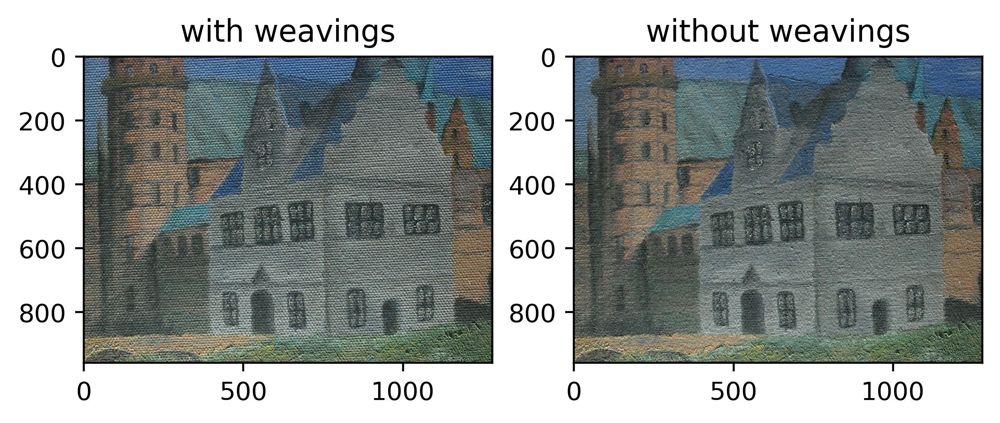

In [123]:
#plotting
fig = plt.figure(dpi=400)
plt.subplot(121)
plt.imshow(img_rgb)
plt.title("with weavings")
plt.subplot(122)
plt.imshow(img_filt)
plt.title("without weavings")


canvas weavings are less prominent in the resulting filtered image. by applying the filter mask to the fourier transforms of the individual color channels and then reconstructing the image, the canvas weave pattern is effectively attenuated or removed. this method leverages the fourier domain representation of the image to selectively suppress specific frequency components associated with the unwanted pattern, resulting in a visually cleaner image without the canvas weave interference.

Text(0.5, 1.0, 'weavings that were removed')

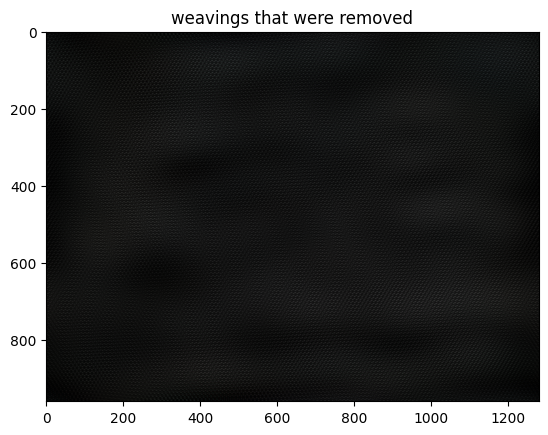

In [122]:
inverted_mask = fftshift(1-mask)

b,g,r = cv2.split(img_rgb)

redfiltinv = inverted_mask * fft2(r)
bluefiltinv = inverted_mask * fft2(b)
greenfiltinv = inverted_mask * fft2(g)

red_newinv = np.abs(ifft2(redfiltinv)).astype(np.uint8)
green_newinv = np.abs(ifft2(greenfiltinv)).astype(np.uint8)
blue_newinv = np.abs(ifft2(bluefiltinv)).astype(np.uint8)

img_filtinv = cv2.merge([blue_newinv,green_newinv,red_newinv])
plt.imshow(img_filtinv)
plt.title("weavings that were removed")


if zoomed in, weavings are visible. these are the weavings that were "removed" or filtered out from the original image.

#to test the automated filter mask generator:

Text(0.5, 1.0, 'without weavings')

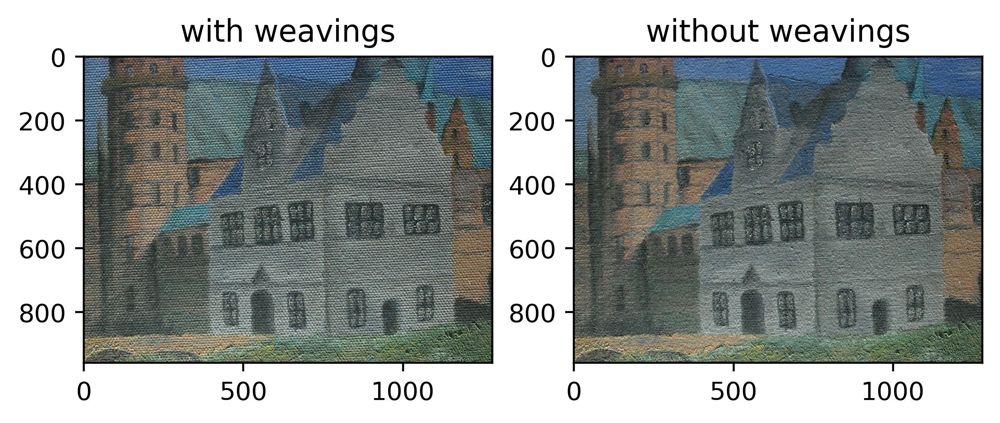

In [121]:
b,g,r = cv2.split(img_rgb)                                      # splitting to seperate bands, bgr is standard for cv2
mask_decentered = fftshift(maskk)                                # shifting mask again to decenter

redfft = fft2(r)                                                # fft of r, g, and b
bluefft = fft2(b)
greenfft = fft2(g)

redfilt = mask_decentered * redfft                              # application of filter: decentered mask * decentered ffts of r g and b
bluefilt = mask_decentered * bluefft
greenfilt = mask_decentered * greenfft

red_new = np.abs(ifft2(redfilt)).astype(np.uint8)               # inversed r,g,b, ready for merging
green_new = np.abs(ifft2(greenfilt)).astype(np.uint8)
blue_new = np.abs(ifft2(bluefilt)).astype(np.uint8)

img_filt = cv2.merge([blue_new,green_new,red_new])              # filtered rgb merged

fig = plt.figure(dpi=400)
plt.subplot(121)
plt.imshow(img_rgb)
plt.title("with weavings")
plt.subplot(122)
plt.imshow(img_filt)
plt.title("without weavings")


there seems to be little to no significant difference from the results using the manually made mask and the automated mask

Text(0.5, 1.0, 'weavings that were removed')

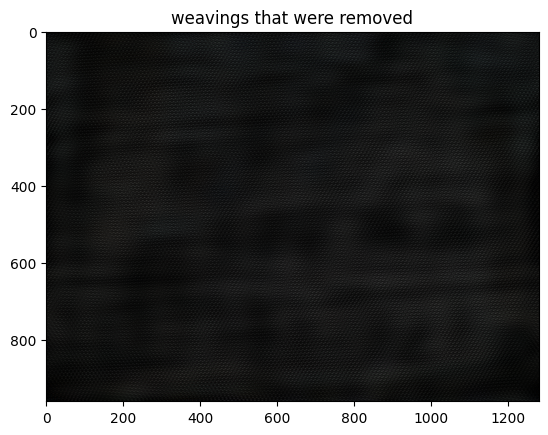

In [120]:
inverted_mask = fftshift(1-maskk)

b,g,r = cv2.split(img_rgb)

redfiltinv = inverted_mask * fft2(r)
bluefiltinv = inverted_mask * fft2(b)
greenfiltinv = inverted_mask * fft2(g)

red_newinv = np.abs(ifft2(redfiltinv)).astype(np.uint8)
green_newinv = np.abs(ifft2(greenfiltinv)).astype(np.uint8)
blue_newinv = np.abs(ifft2(bluefiltinv)).astype(np.uint8)

img_filtinv = cv2.merge([blue_newinv,green_newinv,red_newinv])
plt.imshow(img_filtinv)
plt.title("weavings that were removed")


since the automated filter mask had more "blocked" peaks, the weavings "removed" or filtered are more defined.